<a href="https://colab.research.google.com/github/jvcronik/Science-Data/blob/ScienceDataDS/Arrythmia_DS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



## Arritmia
Script hecho para identificar la Arritmia o varias Arritmias en los pacientes


Hecho por

Ricardo Trujillo,
Sandra Gargiulo,
Juliana Parra,
Alexander Palacios y
Julio Villatoro

Datos reales obtenidos del sitio:

https://www.physionet.org/content/mitdb/1.0.0/


In [ ]:
## Revision de Version de Phyton

!python --version

Python 3.10.12


## Carga de Librerias

In [2]:
### Instalacion de Librerias Necesarias para Colab ###

!pip install heartpy
!pip install biosppy
!pip install neurokit2


## Importando Librerias ###
import neurokit2
import numpy as np
import pandas as pd
import os
import matplotlib as plt
import matplotlib.pyplot as plt
import csv
import itertools
import pywt
from scipy import stats
from sklearn.utils import resample
from sklearn.model_selection import train_test_split
import heartpy as hp
import biosppy.signals.ecg as ecg


%matplotlib inline

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 14.0 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.0/107.0 kB 4.0 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 18.3 MB/s eta 0:00:00


In [3]:

## Propiedades para Mostrar Graficos ####
plt.rcParams["figure.figsize"] = (30,6)
plt.rcParams['lines.linewidth'] = 1
plt.rcParams['lines.color'] = 'b'
plt.rcParams['axes.grid'] = True

In [4]:

## Subiendo CSV de Paciente ###
import io
from google.colab import files
uploaded = files.upload()


Saving 100.csv to 100.csv


In [5]:
## Definiendo CSV de paciente a un Data Frame

import io
df = pd.read_csv(io.BytesIO(uploaded['100.csv']))


## Analisis Exploratorio(EDA)

In [140]:
df.describe()

,'sample #','MLII','V5'
count,650000.000000,650000.000000,650000.000000
mean,324999.500000,962.740205,985.793114
std,187638.981824,38.639938,29.642668
min,0.000000,481.000000,531.000000
25%,162499.750000,946.000000,971.000000
50%,324999.500000,957.000000,983.000000
75%,487499.250000,970.000000,995.000000
max,649999.000000,1311.000000,1269.000000


In [ ]:
df.head()

,'sample #','MLII','V5'
0,0,995,1011
1,1,995,1011
2,2,995,1011
3,3,995,1011
4,4,995,1011


In [ ]:
df.info

<bound method DataFrame.info of         'sample #'  'MLII'  'V5'
0                0     995  1011
1                1     995  1011
2                2     995  1011
3                3     995  1011
4                4     995  1011
...            ...     ...   ...
649995      649995    1009   928
649996      649996     935   942
649997      649997     889   951
649998      649998     871   957
649999      649999     768  1024

[650000 rows x 3 columns]>

# Carga de Graficos de Electocardiograma(ECG)

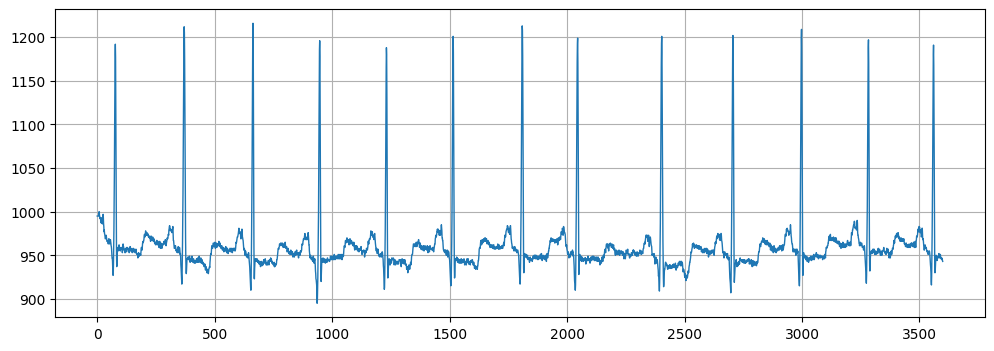

In [142]:
## Libreria HeartPy

import matplotlib.pyplot as plt
sample_rate = 360
plt.figure(figsize=(12,4))
plt.plot(df["'MLII'"][0:3600])
plt.show()

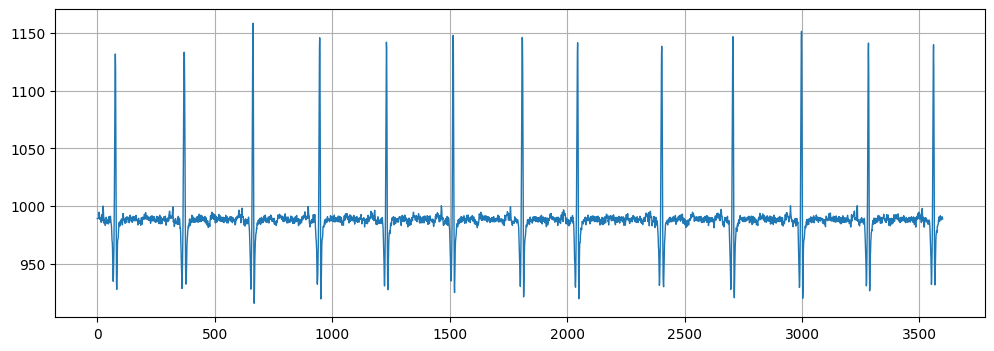

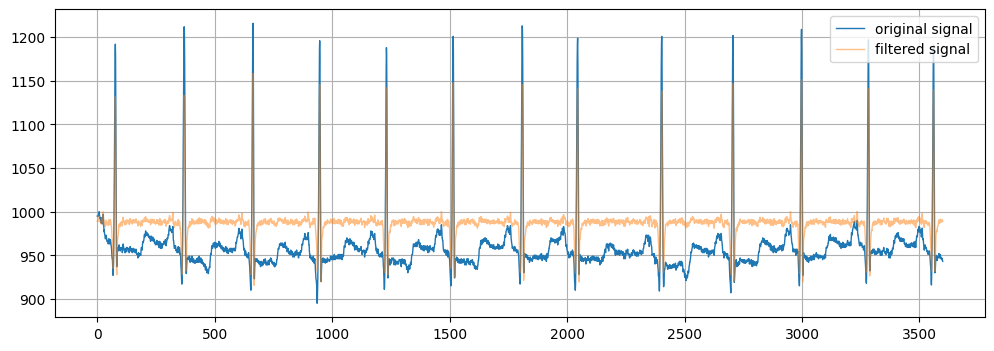

In [143]:
filtered = hp.filter_signal(df["'MLII'"][0:3600], cutoff = 0.05, sample_rate = sample_rate, filtertype='notch')
plt.figure(figsize=(12,4))
plt.plot(filtered)
plt.show()
plt.figure(figsize=(12,4))
plt.plot(df["'MLII'"][0:3600], label = 'original signal')
plt.plot(filtered[0:3600], alpha=0.5, label = 'filtered signal')
plt.legend()
plt.show()

bpm: 74.418605
ibi: 806.250000
sdnn: 71.937875
sdsd: 101.063117
rmssd: 123.341978
pnn20: 0.636364
pnn50: 0.272727
hr_mad: 12.500000
sd1: 87.169142
sd2: 59.602379
s: 16322.107813
sd1/sd2: 1.462511
breathingrate: 0.310334


<Figure size 1200x400 with 0 Axes>

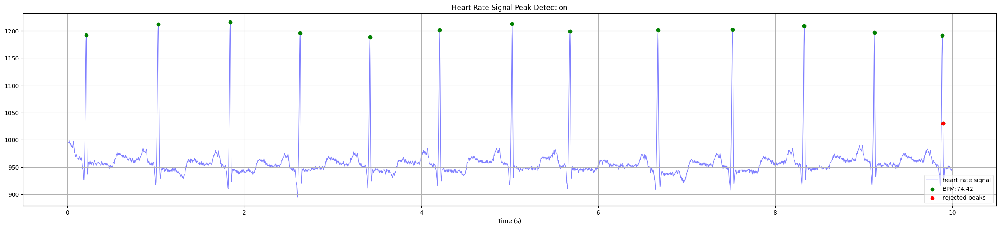

In [144]:
wd, m = hp.process(df["'MLII'"][0:3600], sample_rate)
plt.figure(figsize=(12,4))
hp.plotter(wd, m)

#proceso que muestra algunas medidas para el control de la Arritmia ####
for measure in m.keys():
    print('%s: %f' %(measure, m[measure]))



# Obteniendo Valores de R,RR, RRPost de(ECG)

In [8]:

### Obteniendo poblacion de Picos R ###

a = np.array(df["'MLII'"], dtype=np.float32)
_, results = neurokit2.ecg_peaks(a, sampling_rate=360)
rpeaks = results["ECG_R_Peaks"]
print(rpeaks)
val = a[rpeaks]
data_array = rpeaks
print("Array Generado:")
print(data_array)
df_peaks = pd.DataFrame(data_array)
print("DataFrame Generado de Array:")
print(df_peaks)




[   370    663    947 ... 649232 649485 649734]
Array Generado:
[   370    663    947 ... 649232 649485 649734]
DataFrame Generado de Array:
           0
0        370
1        663
2        947
3       1231
4       1515
...      ...
2266  648733
2267  648978
2268  649232
2269  649485
2270  649734

[2271 rows x 1 columns]


In [20]:

## Obteniendo diferencias entre Picos R ###
rr = np.diff(rpeaks)
data_array_rr = rr

data_df_rr = pd.DataFrame(data_array_rr)

data_df_rr.columns = ['RR']

In [23]:
### obteniendo RR post ####
posicion = 2
contador = 0
results = []

### Ciclo para obtener de Vector rpeaks los valores de RRpost ####

for posicion in range(2, len(rpeaks)-1):
    valor = rpeaks[posicion]
    valor1 = rpeaks[posicion+1]
    a = valor1 - valor
    results.append(a)
    contador += 1
    print (results)

    ## convirtiendo Resultado de Array en Data Frame ####

    df_RR_post = pd.DataFrame(results)
    df_RR_post.columns = ['RR_post']

    ## Agregando a DataFrame Final de RR_post

    data_df_rr['RR_post'] = df_RR_post["RR_post"]

[284]
[284, 284]
[284, 284, 294]
[284, 284, 294, 236]
[284, 284, 294, 236, 358]
[284, 284, 294, 236, 358, 303]
[284, 284, 294, 236, 358, 303, 292]
[284, 284, 294, 236, 358, 303, 292, 285]
[284, 284, 294, 236, 358, 303, 292, 285, 277]
[284, 284, 294, 236, 358, 303, 292, 285, 277, 303]
[284, 284, 294, 236, 358, 303, 292, 285, 277, 303, 308]
[284, 284, 294, 236, 358, 303, 292, 285, 277, 303, 308, 295]
[284, 284, 294, 236, 358, 303, 292, 285, 277, 303, 308, 295, 299]
[284, 284, 294, 236, 358, 303, 292, 285, 277, 303, 308, 295, 299, 296]
[284, 284, 294, 236, 358, 303, 292, 285, 277, 303, 308, 295, 299, 296, 286]
[284, 284, 294, 236, 358, 303, 292, 285, 277, 303, 308, 295, 299, 296, 286, 287]
[284, 284, 294, 236, 358, 303, 292, 285, 277, 303, 308, 295, 299, 296, 286, 287, 284]
[284, 284, 294, 236, 358, 303, 292, 285, 277, 303, 308, 295, 299, 296, 286, 287, 284, 297]
[284, 284, 294, 236, 358, 303, 292, 285, 277, 303, 308, 295, 299, 296, 286, 287, 284, 297, 312]
[284, 284, 294, 236, 358, 303, 

# Algoritmo de Machine Learning K-Means

In [24]:
## Modelo de K-Means

# Importamos las librerias necesarias para implementar un modelo K-Means y un estandarizador de variables
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.metrics import calinski_harabasz_score


In [25]:

# Reemplazar cualquier valor que se interprete como NaN por np.nan
data_df_rr = data_df_rr.replace('NaN', np.nan)

# Reemplazar los valores NaN con el promedio de cada columna
df_filled = data_df_rr.fillna(data_df_rr.mean())


## Generando K-means como DataFrame
km = KMeans(n_clusters=3)
y_predicted = km.fit_predict(df_filled[['RR','RR_post']])
y_predicted

data_ykmeans = pd.DataFrame(y_predicted)
data_ykmeans.columns = ['YR']



/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [28]:
### Agregando Columna  Y de Kmeans y RR post a Data Frame que trae  RR

df_filled['YR'] = data_ykmeans["YR"]
##data_df_rr['RR_post'] = df_RR_post["RR_post"]

In [45]:

# Estandarizamos las variables:
scaler01 = StandardScaler()
X_Scaled = pd.DataFrame(scaler01.fit_transform(df_filled));
### Columnas a manejar en K-means ###
X_Scaled.columns = ['RR_Scaled','RRpost_Scaled','YR_Scaled']



In [46]:
kmeans = KMeans(n_clusters = 3,
                n_init = 10,
                max_iter = 50)
kmeans.fit(X_Scaled)

# Guardamos las etiquetas generadas por el modelo y las coordenadas de los centroides
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

In [47]:
## Impresion de etiquetas y centrooides
print(labels)
print(centroids)

[1 0 0 ... 2 2 2]
[[-0.07697016  0.66759013  1.09107218]
 [ 0.76201541 -0.09532702 -1.18952989]
 [-1.07366212 -1.034833   -0.04922886]]


In [48]:
## Columnas a Manejar en K-means
X_Scaled.columns

Index(['RR_Scaled', 'RRpost_Scaled', 'YR_Scaled'], dtype='object')

## Graficos para estudio de K-means

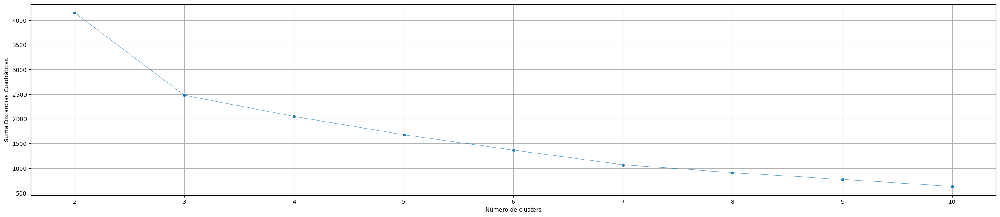

In [49]:
import seaborn as sns

# Se instancia una lista vacía, en la que se almacenará la suma de distancias
sq_distances = []
# ACTIVIDAD: Elegir un set de valores de K apropiados para probar
k_values = [2, 3, 4, 5, 6, 7, 8, 9, 10]

# Se entrenan 9 K-means con los valores de K almacenados en k_values
for k in k_values:
    kmeans = KMeans(n_clusters = k, n_init = 10, random_state = 0) # Se instancia K-means, con el valor de K dado
    kmeans.fit(X_Scaled) # Se aplica método fit
    sq_distances.append(kmeans.inertia_) # Se almacena la suma de distancias (se aplica el método inertia_)

# Se graficó las sumas de las distancias
sns.lineplot(x=k_values, y=sq_distances, marker='o', size=30, legend=False);
plt.ylabel('Suma Distancias Cuadráticas');plt.xlabel('Número de clusters');

<Axes: xlabel='RR', ylabel='YR'>

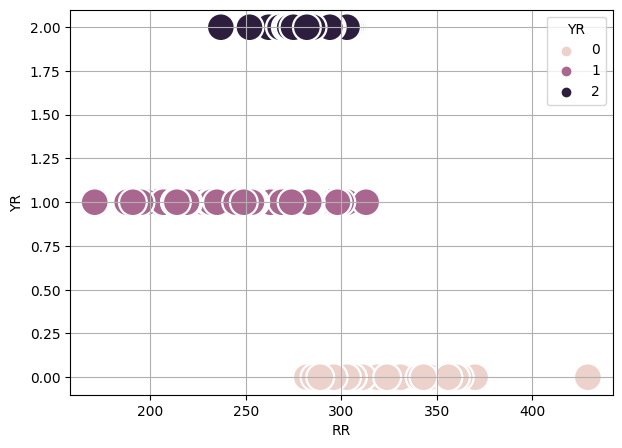

In [50]:
fig, ax = plt.subplots(1, 1, figsize=(7,5))
sns.scatterplot(data=data_df_rr, x="RR", y="YR",s=400,hue="YR")

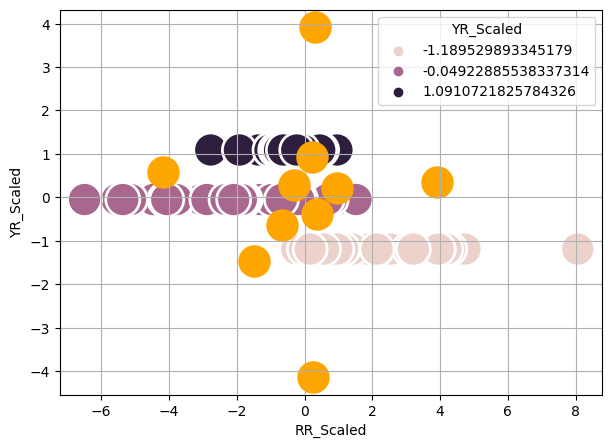

In [51]:
# Plot the data
fig, ax = plt.subplots(1, 1, figsize=(7,5))

###plt.scatter(X_Scaled["RR_Scaled"],
            ###X_Scaled["YR_Scaled"])

sns.scatterplot(data=X_Scaled, x="RR_Scaled", y="YR_Scaled",s=600,hue="YR_Scaled")

# Plot the clusters
plt.scatter(kmeans.cluster_centers_[:, 0],
            kmeans.cluster_centers_[:, 1],
            s=500,                             # Set centroid size
            c='orange')                           # Set centroid color
plt.show()

<Axes: xlabel='RR_Scaled', ylabel='YR_Scaled'>

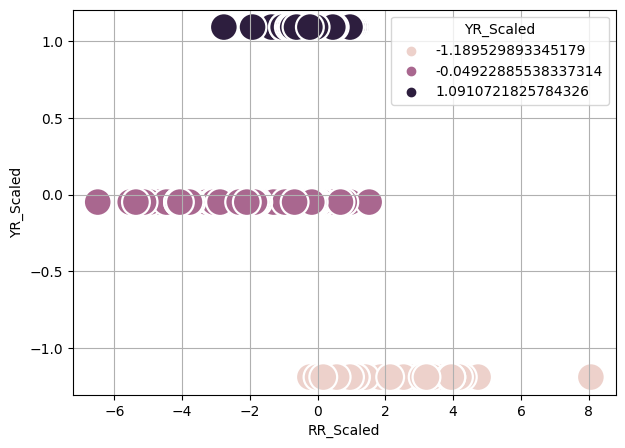

In [52]:
## Graficos Kmeans

fig, ax = plt.subplots(1, 1, figsize=(7,5))

sns.scatterplot(data=X_Scaled, x="RR_Scaled", y="YR_Scaled",s=400,hue="YR_Scaled")



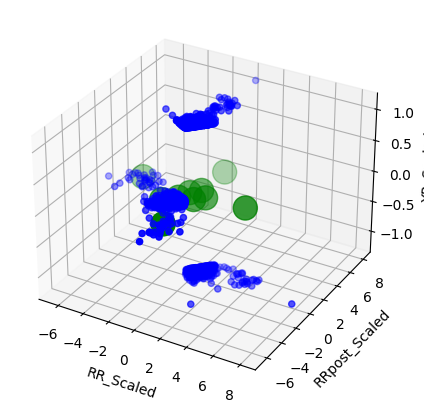

In [68]:
# Crear la figura y el espacio 3D
###fig = plt.figure()
fig = plt.figure(figsize=(7, 5))
ax = fig.add_subplot(111, projection='3d')

x = X_Scaled['RR_Scaled'].values
y = X_Scaled['RRpost_Scaled'].values
z = X_Scaled['YR_Scaled'].values


cmap_x = plt.get_cmap('Blues')
cmap_y = plt.get_cmap('Greens')
cmap_z = plt.get_cmap('Reds')

color = (cmap_x,cmap_y,cmap_z)


# Generar el gráfico de dispersión en 3D
ax.scatter(x,y,z, c='b', marker='o')

# Configurar etiquetas de los ejes
ax.set_xlabel('RR_Scaled')
ax.set_ylabel('RRpost_Scaled')
ax.set_zlabel('YR_Scaled')

plt.scatter(kmeans.cluster_centers_[:, 0],
            kmeans.cluster_centers_[:, 1],
            s=300,                             # Set centroid size
            c='green')

# Mostrar el gráfico
plt.show()

In [182]:
df_centroids = pd.DataFrame(centroids)

df_centroids.columns = ['RR_centroids','YR_Centroids','RRpost_Centroids']

In [61]:
import plotly.express as px
##df = px.data.iris()
fig = px.scatter_3d(X_Scaled, x='RR_Scaled', y='RRpost_Scaled', z='YR_Scaled',
              color='YR_Scaled', symbol='YR_Scaled')
                         # Set centroid color
fig.add_trace(px.scatter(centroids, x=kmeans.cluster_centers_[:, 0], y=kmeans.cluster_centers_[:, 1],
                         color=kmeans.cluster_centers_[:, 0]).data[0])

fig.show()